# Project 3 — House Price Forecasting

Quick outline:
- Load features from `feature_house.csv`
- Build a simple baseline for reference
- Train a couple of tree-based models (e.g., RandomForest, LightGBM, XGBoost)
- Use cross-validation and report RMSE/MAE/R2
- Do hyperparameter tuning with Optuna (mainly for LightGBM to keep it reasonable)
- Explain results with SHAP and simple plots



In [1]:
# ---- Imports & global config ----
import os
import json
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd

from typing import Dict, Tuple

# Reproducibility
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)

# Display settings for friendlier outputs
pd.set_option("display.max_columns", 120)
pd.set_option("display.width", 140)

# Paths
DATA_PATH = os.path.join(".", "feature_house.csv")  # assuming notebook lives in notebooks/
OUTPUT_DIR = os.path.join(".", "artifacts")
os.makedirs(OUTPUT_DIR, exist_ok=True)

print(f"Using data at: {os.path.abspath(DATA_PATH)}")
print(f"Artifacts will be saved to: {os.path.abspath(OUTPUT_DIR)}")


Using data at: E:\ryan\code\297.301\assignment3\feature_house.csv
Artifacts will be saved to: E:\ryan\code\297.301\assignment3\artifacts


## Setup note

If imports fail in your environment, please run the cell below to install dependencies.


In [2]:
# optional install — comment out if you already have these
# !pip install -r ../requirements.txt

In [3]:
# Load data
raw = pd.read_csv(DATA_PATH)
print("Shape:", raw.shape)
print("Columns:", list(raw.columns)[:12], "...")

if 'quarter' in raw.columns:
    raw['quarter'] = pd.to_datetime(raw['quarter'], errors='coerce')
    raw = raw.sort_values('quarter').reset_index(drop=True)

# quick NA summary
na_summary = raw.isna().mean().sort_values(ascending=False)
print("Top 10 NA rates:\n", na_summary.head(10))

# I'll try to use lag-based / past information as much as possible.
TARGET_COL = 'hpi'
assert TARGET_COL in raw.columns, "Expected 'hpi' in columns. Please check data."

Shape: (142, 55)
Columns: ['quarter', 'year', 'quarter_num', 'house_sales', 'hpi', 'house_stock', 'residential_investment', 'ocr', 'cpi', 'gdp', 'hpi_growth', 'hpi_growth_lag1'] ...
Top 10 NA rates:
 ocr_rolling_mean_4y                0.288732
ocr_rolling_mean_1y                0.288732
ocr_rolling_mean_10y               0.288732
ocr                                0.281690
hpi_growth_lag16                   0.119718
house_sales_lag16                  0.112676
hpi_growth_ratio_lag1_over_lag4    0.056338
hpi_growth_ratio_lag1_over_lag2    0.042254
hpi_growth_diff_lag1_minus_lag4    0.035211
hpi_growth_lag4                    0.035211
dtype: float64


In [4]:
# ---- Feature selection heuristic ----
# Heuristic: keep columns that include 'lag' OR are macro variables that are reasonably known
# before/at the start of a quarter. Drop columns that directly reveal current 'hpi' level.

cols = list(raw.columns)

drop_exact = {'hpi'}  # target
# Anything that contains 'hpi' but is not a lag term could leak current info.
# I'll keep 'hpi_growth_lag*' but drop plain 'hpi_growth' if present.

feature_candidates = []
for c in cols:
    if c in drop_exact:
        continue
    if c == 'quarter' or c == 'year':
        # keep time metadata for potential splits/plots but not as model features
        continue
    if 'hpi' in c and 'lag' not in c:
        # drop non-lag hpi-based signals (e.g., rolling means) to be safe
        continue
    feature_candidates.append(c)

# now only keep numeric columns from the candidates
num_features = [c for c in feature_candidates if pd.api.types.is_numeric_dtype(raw[c])]

# Drop rows with missing in selected features or target
df = raw.dropna(subset=num_features + [TARGET_COL]).copy()
print("After dropna shape:", df.shape)

X = df[num_features]
y = df[TARGET_COL]

# Keep time index for splitting
time_index = df['quarter'] if 'quarter' in df.columns else pd.RangeIndex(len(df))


After dropna shape: (94, 55)


In [5]:
# ---- CV helpers & metrics ----
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


def compute_regression_metrics(y_true, y_pred) -> Dict[str, float]:
    # Using RMSE/MAE/R2 as the core trio, friendly for presentations
    rmse = float(np.sqrt(mean_squared_error(y_true, y_pred)))
    mae = float(mean_absolute_error(y_true, y_pred))
    r2 = float(r2_score(y_true, y_pred))
    return {"rmse": rmse, "mae": mae, "r2": r2}


def run_timeseries_cv(model, X, y, n_splits: int = 5):
    # I use expanding-window style TimeSeriesSplit.
    tscv = TimeSeriesSplit(n_splits=n_splits)
    fold_metrics = []
    oof_pred = np.full(shape=len(y), fill_value=np.nan)

    for fold_id, (train_idx, valid_idx) in enumerate(tscv.split(X)):
        X_tr, X_va = X.iloc[train_idx], X.iloc[valid_idx]
        y_tr, y_va = y.iloc[train_idx], y.iloc[valid_idx]

        model.fit(X_tr, y_tr)
        pred = model.predict(X_va)
        metrics = compute_regression_metrics(y_va, pred)
        fold_metrics.append(metrics)
        oof_pred[valid_idx] = pred
        print(f"Fold {fold_id+1}: {metrics}")

    # aggregate
    avg = {k: float(np.mean([m[k] for m in fold_metrics])) for k in fold_metrics[0].keys()}
    std = {k: float(np.std([m[k] for m in fold_metrics])) for k in fold_metrics[0].keys()}
    summary = {f"{k}_mean": avg[k] for k in avg}
    summary.update({f"{k}_std": std[k] for k in std})
    return summary, oof_pred, fold_metrics


In [6]:
# ---- Baseline model (Ridge) ----
from sklearn.linear_model import Ridge

baseline = Ridge(alpha=1.0, random_state=RANDOM_SEED)
base_summary, base_oof, base_folds = run_timeseries_cv(baseline, X, y, n_splits=5)
print("Baseline summary:", base_summary)


Fold 1: {'rmse': 265.8459330474786, 'mae': 237.68296048593183, 'r2': -15.048183441343465}
Fold 2: {'rmse': 96.83847266253366, 'mae': 77.65117383820856, 'r2': -1.4936714541819178}
Fold 3: {'rmse': 66.0306823484119, 'mae': 58.314997440865106, 'r2': 0.9250371197501346}
Fold 4: {'rmse': 39.28844091178652, 'mae': 26.834319108633643, 'r2': 0.9862230205996776}
Fold 5: {'rmse': 82.48107346449005, 'mae': 68.15713004893081, 'r2': 0.7749989588611882}
Baseline summary: {'rmse_mean': 110.09692048694015, 'mae_mean': 93.728116184514, 'r2_mean': -2.7711191592628763, 'rmse_std': 80.1895884544734, 'mae_std': 73.9786586406903, 'r2_std': 6.208257810830747}


In [7]:
# ---- Tree models: RandomForest, LightGBM, XGBoost ----
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor

rf = RandomForestRegressor(
    n_estimators=500,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    random_state=RANDOM_SEED,
    n_jobs=-1,
)
rf_summary, rf_oof, rf_folds = run_timeseries_cv(rf, X, y, n_splits=5)
print("RF summary:", rf_summary)

lgbm = LGBMRegressor(
    n_estimators=800,
    learning_rate=0.05,
    num_leaves=31,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=RANDOM_SEED,
    n_jobs=-1,
)
lgbm_summary, lgbm_oof, lgbm_folds = run_timeseries_cv(lgbm, X, y, n_splits=5)
print("LGBM summary:", lgbm_summary)

xgb = XGBRegressor(
    n_estimators=800,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=RANDOM_SEED,
    n_jobs=-1,
    objective='reg:squarederror'
)
xgb_summary, xgb_oof, xgb_folds = run_timeseries_cv(xgb, X, y, n_splits=5)
print("XGB summary:", xgb_summary)


Fold 1: {'rmse': 248.9884484431624, 'mae': 240.04426666666672, 'r2': -13.077457868418664}
Fold 2: {'rmse': 158.34355437970945, 'mae': 133.7932, 'r2': -5.667210244547555}
Fold 3: {'rmse': 459.2688783246694, 'mae': 391.54040000000003, 'r2': -2.6265087409409453}
Fold 4: {'rmse': 575.4188158276833, 'mae': 462.16106666666667, 'r2': -1.9552385063895859}
Fold 5: {'rmse': 481.5401097653237, 'mae': 469.6566666666666, 'r2': -6.669037361133812}
RF summary: {'rmse_mean': 384.71196134810964, 'mae_mean': 339.43911999999995, 'r2_mean': -5.999090544286112, 'rmse_std': 155.54231332285087, 'mae_std': 131.834297747575, 'r2_std': 3.95952786505566}
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 19, number of used features: 0
[LightGBM] [Info] Start tr

## Optuna Tuning (LightGBM)

I'll tune a few impactful hyperparameters and keep the search space moderate to avoid crazy runtimes. The objective is cross-validated RMSE. I'll also enable pruning to stop bad trials early.



In [8]:
import optuna
from optuna.pruners import MedianPruner


def objective_lgbm(trial: optuna.Trial) -> float:
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 300, 1200),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.2, log=True),
        "num_leaves": trial.suggest_int("num_leaves", 15, 127),
        "max_depth": trial.suggest_int("max_depth", -1, 16),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
        "reg_alpha": trial.suggest_float("reg_alpha", 1e-8, 10.0, log=True),
        "reg_lambda": trial.suggest_float("reg_lambda", 1e-8, 10.0, log=True),
        "random_state": RANDOM_SEED,
        "n_jobs": -1,
    }

    model = LGBMRegressor(**params)
    summary, _, _ = run_timeseries_cv(model, X, y, n_splits=5)
    return summary["rmse_mean"]

study = optuna.create_study(direction="minimize", pruner=MedianPruner(n_startup_trials=5, n_warmup_steps=0))
study.optimize(objective_lgbm, n_trials=25, timeout=600)

print("Best value (RMSE):", study.best_value)
print("Best params:", study.best_params)

best_lgbm = LGBMRegressor(**{**study.best_params, "random_state": RANDOM_SEED, "n_jobs": -1})
best_summary, best_oof, _ = run_timeseries_cv(best_lgbm, X, y, n_splits=5)
print("Best LGBM summary:", best_summary)


[I 2025-10-11 12:46:20,091] A new study created in memory with name: no-name-c1ef72c7-6065-4d44-bc4b-f1ae7c87b5c9


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 19, number of used features: 0
[LightGBM] [Info] Start training from score 951.736842
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the sp

[I 2025-10-11 12:46:20,401] Trial 0 finished with value: 545.7139127359792 and parameters: {'n_estimators': 820, 'learning_rate': 0.01641582608754013, 'num_leaves': 27, 'max_depth': 7, 'subsample': 0.7236034731139405, 'colsample_bytree': 0.731662438196403, 'reg_alpha': 7.569480578603388, 'reg_lambda': 0.1563469217857382}. Best is trial 0 with value: 545.7139127359792.


Fold 4: {'rmse': 674.6634244736225, 'mae': 590.0381498902191, 'r2': -3.0625503060539048}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1156
[LightGBM] [Info] Number of data points in the train set: 79, number of used features: 42
[LightGBM] [Info] Start training from score 1679.658228
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[I 2025-10-11 12:46:20,916] Trial 1 finished with value: 671.5303655054361 and parameters: {'n_estimators': 1152, 'learning_rate': 0.0020310152386581624, 'num_leaves': 33, 'max_depth': 3, 'subsample': 0.9903004417093285, 'colsample_bytree': 0.6467133946935518, 'reg_alpha': 0.005195136564724355, 'reg_lambda': 9.371932640342595e-07}. Best is trial 0 with value: 545.7139127359792.


Fold 5: {'rmse': 1044.2529998047203, 'mae': 1031.5095779096105, 'r2': -35.06512001451402}
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 19, number of used features: 0
[LightGBM] [Info] Start training from score 951.736842
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requiremen

[I 2025-10-11 12:46:21,344] Trial 2 finished with value: 549.0856238666909 and parameters: {'n_estimators': 1167, 'learning_rate': 0.010548986727508406, 'num_leaves': 119, 'max_depth': 4, 'subsample': 0.706530165387501, 'colsample_bytree': 0.9541022833399143, 'reg_alpha': 7.309608809379749e-07, 'reg_lambda': 9.07580425220854e-07}. Best is trial 0 with value: 545.7139127359792.


Fold 5: {'rmse': 805.3559475024103, 'mae': 787.4243193589933, 'r2': -20.4512033183037}
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 19, number of used features: 0
[LightGBM] [Info] Start training from score 951.736842
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


[I 2025-10-11 12:46:21,689] Trial 3 finished with value: 524.2546216028261 and parameters: {'n_estimators': 990, 'learning_rate': 0.16649763586032407, 'num_leaves': 29, 'max_depth': 14, 'subsample': 0.8302055211412772, 'colsample_bytree': 0.7146822570858972, 'reg_alpha': 0.5028335921233805, 'reg_lambda': 1.3148144539757892e-05}. Best is trial 3 with value: 524.2546216028261.


Fold 5: {'rmse': 749.0974503049467, 'mae': 725.1626773153454, 'r2': -17.55891387715369}
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 19, number of used features: 0
[LightGBM] [Info] Start training from score 951.736842
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements

[I 2025-10-11 12:46:21,851] Trial 4 finished with value: 582.0565040111312 and parameters: {'n_estimators': 380, 'learning_rate': 0.01778737633527014, 'num_leaves': 81, 'max_depth': 12, 'subsample': 0.9249015474125527, 'colsample_bytree': 0.7238421566423591, 'reg_alpha': 1.4633504574583607, 'reg_lambda': 0.011687175611682258}. Best is trial 3 with value: 524.2546216028261.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-10-11 12:46:22,088] Trial 5 finished with value: 656.6798745616449 and parameters: {'n_estimators': 636, 'learning_rate': 0.004258185202764269, 'num_leaves': 47, 'max_depth': 12, 'subsample': 0.9009106211644939, 'colsample_bytree': 0.8465902611947722, 'reg_alpha': 6.195642552662293e-08, 'reg_lambda': 6.560624251079209e-08}. Best is trial 3 with value: 524.2546216028261.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-10-11 12:46:22,349] Trial 6 finished with value: 528.2185016177247 and parameters: {'n_estimators': 694, 'learning_rate': 0.03744049907532525, 'num_leaves': 19, 'max_depth': 7, 'subsample': 0.7890233027582799, 'colsample_bytree': 0.6038794219658382, 'reg_alpha': 5.742207254964606e-07, 'reg_lambda': 0.10577585894541147}. Best is trial 3 with value: 524.2546216028261.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-10-11 12:46:22,543] Trial 7 finished with value: 539.4994085775598 and parameters: {'n_estimators': 442, 'learning_rate': 0.036003572502674344, 'num_leaves': 89, 'max_depth': 10, 'subsample': 0.7076833360675441, 'colsample_bytree': 0.6422131210000052, 'reg_alpha': 6.905789552265794e-05, 'reg_lambda': 1.9365559608823067e-08}. Best is trial 3 with value: 524.2546216028261.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Fold 3: {'rmse': 425.7573368107667, 'mae': 365.3620154717143, 'r2': -2.116584996736687}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 952
[LightGBM] [Info] Number of data points in the train set: 64, number of used features: 42
[LightGBM] [Info] Start training from score 1438.031250
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

[I 2025-10-11 12:46:23,842] Trial 11 finished with value: 529.5760126246059 and parameters: {'n_estimators': 941, 'learning_rate': 0.18363327287836573, 'num_leaves': 57, 'max_depth': 16, 'subsample': 0.6411085210740598, 'colsample_bytree': 0.8952346992805951, 'reg_alpha': 0.2716604629247599, 'reg_lambda': 0.0001238377526804244}. Best is trial 3 with value: 524.2546216028261.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-10-11 12:46:24,278] Trial 12 finished with value: 527.6342949967485 and parameters: {'n_estimators': 1000, 'learning_rate': 0.17385126426148798, 'num_leaves': 58, 'max_depth': 16, 'subsample': 0.6010851028981327, 'colsample_bytree': 0.9916126624155672, 'reg_alpha': 0.2293523858482943, 'reg_lambda': 9.287155822711072e-06}. Best is trial 3 with value: 524.2546216028261.


Fold 4: {'rmse': 618.129513875428, 'mae': 518.5574340306159, 'r2': -2.410227716691667}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1156
[LightGBM] [Info] Number of data points in the train set: 79, number of used features: 42
[LightGBM] [Info] Start training from score 1679.658228
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

[I 2025-10-11 12:46:24,688] Trial 13 finished with value: 523.0323266446112 and parameters: {'n_estimators': 1015, 'learning_rate': 0.07634190522072017, 'num_leaves': 38, 'max_depth': 14, 'subsample': 0.8299869343069257, 'colsample_bytree': 0.9652770094114533, 'reg_alpha': 0.00012420820843930455, 'reg_lambda': 4.07934659846926e-06}. Best is trial 13 with value: 523.0323266446112.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-10-11 12:46:25,092] Trial 14 finished with value: 519.913508622878 and parameters: {'n_estimators': 1036, 'learning_rate': 0.06993537923201658, 'num_leaves': 39, 'max_depth': 14, 'subsample': 0.8341490127598054, 'colsample_bytree': 0.7550540337601548, 'reg_alpha': 4.9707573807158943e-05, 'reg_lambda': 0.0027471426599518594}. Best is trial 14 with value: 519.913508622878.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-10-11 12:46:25,482] Trial 15 finished with value: 520.3204152144759 and parameters: {'n_estimators': 1075, 'learning_rate': 0.06581040030924057, 'num_leaves': 43, 'max_depth': 9, 'subsample': 0.8314294201164477, 'colsample_bytree': 0.7790852608773138, 'reg_alpha': 5.197859053137589e-05, 'reg_lambda': 0.0051791352848224404}. Best is trial 14 with value: 519.913508622878.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-10-11 12:46:25,923] Trial 16 finished with value: 523.2583052084134 and parameters: {'n_estimators': 822, 'learning_rate': 0.07594786891558927, 'num_leaves': 71, 'max_depth': 9, 'subsample': 0.8666209328446508, 'colsample_bytree': 0.7763717249477486, 'reg_alpha': 7.2525528371621455e-06, 'reg_lambda': 7.699716949579192}. Best is trial 14 with value: 519.913508622878.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-10-11 12:46:26,335] Trial 17 finished with value: 520.0720278164816 and parameters: {'n_estimators': 1085, 'learning_rate': 0.0656312887020547, 'num_leaves': 44, 'max_depth': 6, 'subsample': 0.7782436732051872, 'colsample_bytree': 0.7680765621534364, 'reg_alpha': 1.280466708136131e-05, 'reg_lambda': 0.0045206093032629235}. Best is trial 14 with value: 519.913508622878.
IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

[I 2025-10-11 12:46:27,165] Trial 19 finished with value: 784.5417212974253 and parameters: {'n_estimators': 839, 'learning_rate': 0.0011693066330194359, 'num_leaves': 20, 'max_depth': 1, 'subsample': 0.7561275387717721, 'colsample_bytree': 0.7632475447723283, 'reg_alpha': 1.6053330930140717e-08, '

Fold 4: {'rmse': 1102.0156370440525, 'mae': 1049.9513437724668, 'r2': -9.83926746839012}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1156
[LightGBM] [Info] Number of data points in the train set: 79, number of used features: 42
[LightGBM] [Info] Start training from score 1679.658228
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[I 2025-10-11 12:46:27,559] Trial 20 finished with value: 525.3578007851177 and parameters: {'n_estimators': 1083, 'learning_rate': 0.0928252049607665, 'num_leaves': 53, 'max_depth': 6, 'subsample': 0.6681005702945961, 'colsample_bytree': 0.670029208406323, 'reg_alpha': 0.0008988140238924578, 'reg_lambda': 0.03246408288883555}. Best is trial 14 with value: 519.913508622878.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-10-11 12:46:27,966] Trial 21 finished with value: 520.9748252372985 and parameters: {'n_estimators': 1105, 'learning_rate': 0.05642706576253242, 'num_leaves': 43, 'max_depth': 9, 'subsample': 0.8401587008986944, 'colsample_bytree': 0.7661244573553029, 'reg_alpha': 1.5991307644458675e-05, 'reg_lambda': 0.001829476583900451}. Best is trial 14 with value: 519.913508622878.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-10-11 12:46:28,367] Trial 22 finished with value: 530.6152737982662 and parameters: {'n_estimators': 1078, 'learning_rate': 0.02496662750130558, 'num_leaves': 44, 'max_depth': -1, 'subsample': 0.86655599949646, 'colsample_bytree': 0.8354953706278168, 'reg_alpha': 0.0004502224471419375, 'reg_lambda': 0.970752246012131}. Best is trial 14 with value: 519.913508622878.


Fold 5: {'rmse': 766.2415585397001, 'mae': 746.9359749789103, 'r2': -18.41812644676827}
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 19, number of used features: 0
[LightGBM] [Info] Start training from score 951.736842
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements

[I 2025-10-11 12:46:28,696] Trial 23 finished with value: 521.818648453092 and parameters: {'n_estimators': 904, 'learning_rate': 0.05619651300133311, 'num_leaves': 35, 'max_depth': 8, 'subsample': 0.7966568480693402, 'colsample_bytree': 0.7830449232601648, 'reg_alpha': 8.685712155500013e-07, 'reg_lambda': 0.008129621620919665}. Best is trial 14 with value: 519.913508622878.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-10-11 12:46:29,078] Trial 24 finished with value: 523.6078367259763 and parameters: {'n_estimators': 1050, 'learning_rate': 0.10815559213496713, 'num_leaves': 16, 'max_depth': 14, 'subsample': 0.7434635333427582, 'colsample_bytree': 0.734937638475382, 'reg_alpha': 4.4956037401732916e-05, 'reg_lambda': 0.0011374933123364636}. Best is trial 14 with value: 519.913508622878.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

## Visualizations and Explainability

I'll keep plots minimal and focused on communication: residual distribution, pred vs actual, and feature importance (both model-based and SHAP). For SHAP, I'll use the tuned LightGBM because tree SHAP is relatively fast.



[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001350 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1367
[LightGBM] [Info] Number of data points in the train set: 94, number of used features: 42
[LightGBM] [Info] Start training from score 1973.882979
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

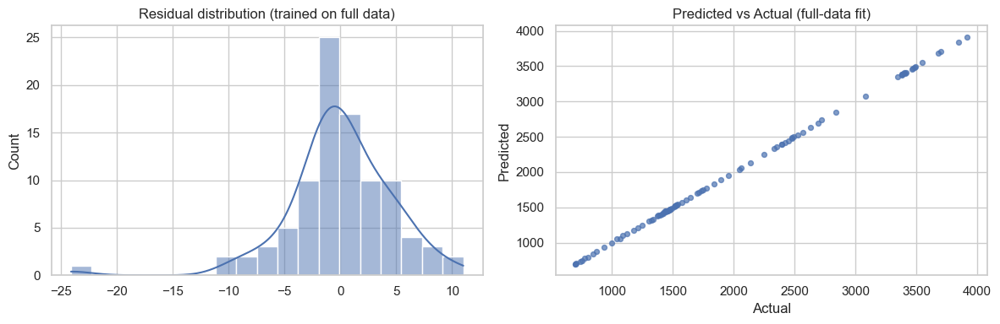

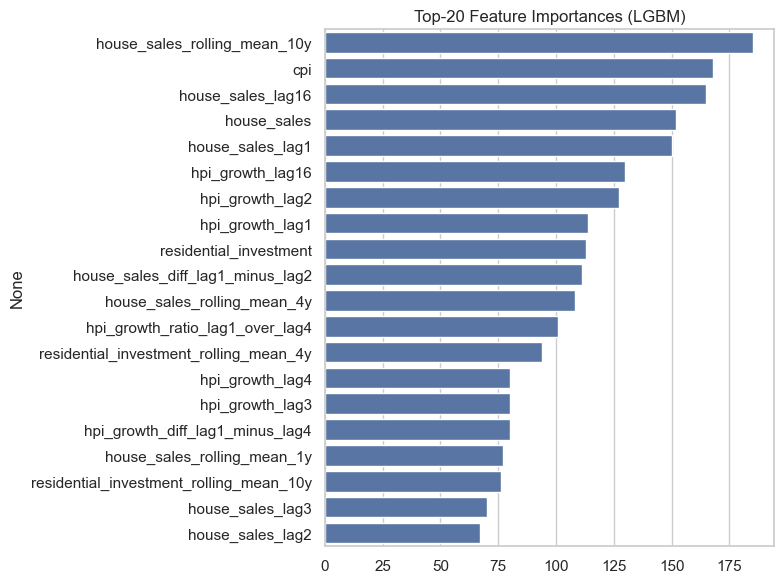

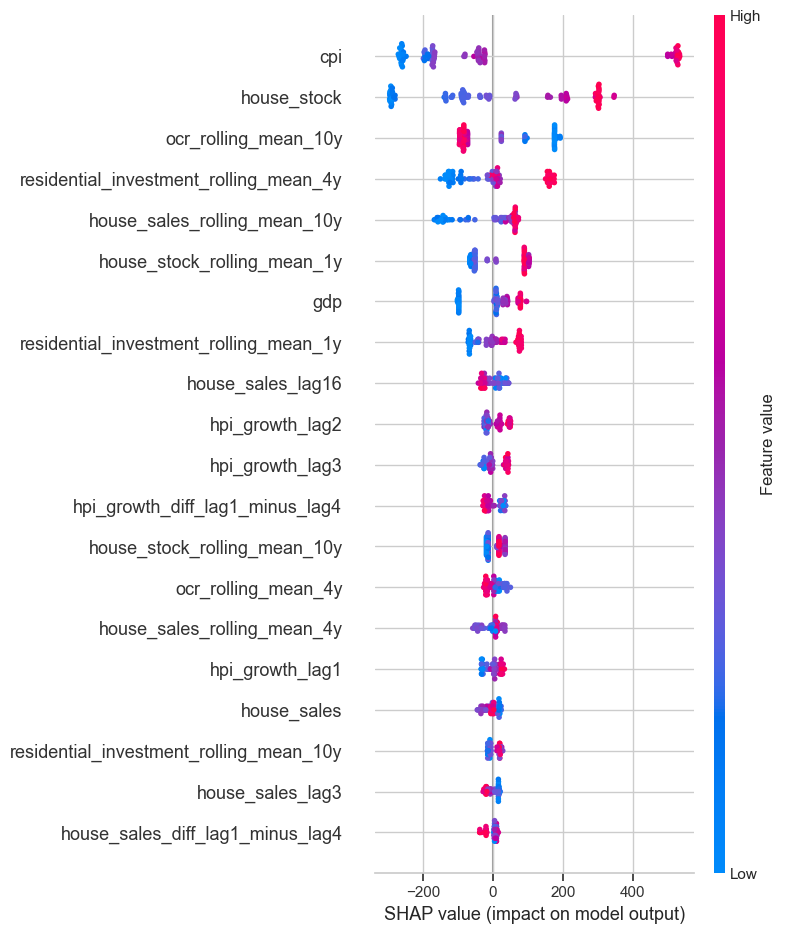

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
import shap

sns.set(style="whitegrid", context="notebook")

# fit best_lgbm on full data for global explainability
best_lgbm.fit(X, y)
full_pred = best_lgbm.predict(X)

# Residuals
residuals = y.values - full_pred
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
sns.histplot(residuals, kde=True, ax=axes[0])
axes[0].set_title("Residual distribution (trained on full data)")

axes[1].scatter(y, full_pred, s=18, alpha=0.7)
axes[1].set_xlabel("Actual")
axes[1].set_ylabel("Predicted")
axes[1].set_title("Predicted vs Actual (full-data fit)")
plt.tight_layout()
plt.show()

# Model-based importance
if hasattr(best_lgbm, "feature_importances_"):
    importances = pd.Series(best_lgbm.feature_importances_, index=X.columns).sort_values(ascending=False)
    topk = importances.head(20)
    plt.figure(figsize=(8, 6))
    sns.barplot(x=topk.values, y=topk.index)
    plt.title("Top-20 Feature Importances (LGBM)")
    plt.tight_layout()
    plt.show()

# SHAP summary
explainer = shap.TreeExplainer(best_lgbm)
# For speed in class, I'll limit to a small sample if data is big
sample_X = X.sample(min(500, len(X)), random_state=RANDOM_SEED)
shap_values = explainer.shap_values(sample_X)
shap.summary_plot(shap_values, sample_X, plot_type="dot", show=True)


## Export artifacts

I'll export metrics and the tuned model so we can load it in Streamlit.

In [10]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import joblib

final_metrics = {
    "baseline_ridge": base_summary,
    "rf": rf_summary,
    "lgbm": lgbm_summary,
    "xgb": xgb_summary,
    "lgbm_tuned": best_summary,
}

with open(os.path.join(OUTPUT_DIR, "metrics.json"), "w") as f:
    json.dump(final_metrics, f, indent=2)

joblib.dump(best_lgbm, os.path.join(OUTPUT_DIR, "best_lgbm.pkl"))

pd.Series(num_features).to_csv(os.path.join(OUTPUT_DIR, "feature_list.csv"), index=False, header=False)

print("Saved metrics.json, best_lgbm.pkl, feature_list.csv to artifacts folder.")


Saved metrics.json, best_lgbm.pkl, feature_list.csv to artifacts folder.


## Environment snapshot

For reproducibility (and to help future me), I'll record basic library versions.

In [11]:
import sklearn, lightgbm, xgboost
print("numpy:", np.__version__)
print("pandas:", pd.__version__)
print("sklearn:", sklearn.__version__)
print("lightgbm:", lightgbm.__version__)
print("xgboost:", xgboost.__version__)
try:
    import optuna
    print("optuna:", optuna.__version__)
except Exception:
    print("optuna not found")

numpy: 2.0.2
pandas: 2.2.3
sklearn: 1.5.2
lightgbm: 4.6.0
xgboost: 3.0.5
optuna: 4.5.0


In [12]:
# ---- Plots output path ----
PLOTS_DIR = os.path.join(OUTPUT_DIR, "plots")
os.makedirs(PLOTS_DIR, exist_ok=True)
print("Plots will be saved to:", os.path.abspath(PLOTS_DIR))

Plots will be saved to: E:\ryan\code\297.301\assignment3\artifacts\plots


In [13]:
# Recompute to be safe in case the previous cell order changed
explainer = shap.TreeExplainer(best_lgbm)
sample_X = X.sample(min(800, len(X)), random_state=RANDOM_SEED)
shap_values = explainer.shap_values(sample_X)

# Summary dot
plt.figure(figsize=(8, 6))
shap.summary_plot(shap_values, sample_X, plot_type="dot", show=False)
plt.tight_layout()
plt.savefig(os.path.join(PLOTS_DIR, "shap_summary_dot.png"), dpi=200)
plt.close()

# Summary bar (mean |shap|)
plt.figure(figsize=(8, 6))
shap.summary_plot(shap_values, sample_X, plot_type="bar", show=False)
plt.tight_layout()
plt.savefig(os.path.join(PLOTS_DIR, "shap_summary_bar.png"), dpi=200)
plt.close()

print("Saved: shap_summary_dot.png, shap_summary_bar.png")

Saved: shap_summary_dot.png, shap_summary_bar.png


In [14]:
# Rank top features by mean absolute SHAP value
abs_mean_shap = np.mean(np.abs(shap_values), axis=0)
ranked_idx = np.argsort(-abs_mean_shap)
ranked_features = [sample_X.columns[i] for i in ranked_idx]

TOP_K = min(5, len(ranked_features))
for i in range(TOP_K):
    feat = ranked_features[i]
    plt.figure(figsize=(6, 5))
    shap.dependence_plot(
        feat,
        shap_values,
        sample_X,
        interaction_index=None,
        show=False
    )
    plt.tight_layout()
    plt.savefig(os.path.join(PLOTS_DIR, f"shap_dependence_{i+1}_{feat}.png"), dpi=200)
    plt.close()

print(f"Saved {TOP_K} SHAP dependence plots.")

Saved 5 SHAP dependence plots.


<Figure size 600x500 with 0 Axes>

<Figure size 600x500 with 0 Axes>

<Figure size 600x500 with 0 Axes>

<Figure size 600x500 with 0 Axes>

<Figure size 600x500 with 0 Axes>

In [15]:
# ---- Local explanation for one sample ----
idx = sample_X.index[0]
local_vals = explainer.shap_values(sample_X.loc[[idx]])
local_vals = local_vals[0]  # shape (n_features)

local_series = pd.Series(local_vals, index=sample_X.columns)
local_top = local_series.reindex(local_series.abs().sort_values(ascending=False).index[:20])

plt.figure(figsize=(8, 6))
local_top.plot(kind='barh')
plt.gca().invert_yaxis()
plt.title("Local explanation (top-20 |SHAP|)")
plt.tight_layout()
plt.savefig(os.path.join(PLOTS_DIR, "shap_local_bar.png"), dpi=200)
plt.close()

print("Saved: shap_local_bar.png")

Saved: shap_local_bar.png


In [16]:
# ---- PDP / ICE using sklearn for top features ----
from sklearn.inspection import PartialDependenceDisplay

# Use top features from model importances if available; otherwise fall back to SHAP ranking
if hasattr(best_lgbm, "feature_importances_"):
    importances = pd.Series(best_lgbm.feature_importances_, index=X.columns).sort_values(ascending=False)
    top_feats = list(importances.head(3).index)
else:
    top_feats = ranked_features[:3]

for feat in top_feats:
    fig, ax = plt.subplots(1, 2, figsize=(12, 4))
    # PDP only
    PartialDependenceDisplay.from_estimator(best_lgbm, X, [feat], ax=ax[0], kind="average")
    ax[0].set_title(f"PDP — {feat}")

    # ICE
    PartialDependenceDisplay.from_estimator(best_lgbm, X, [feat], ax=ax[1], kind="individual")
    ax[1].set_title(f"ICE — {feat}")

    plt.tight_layout()
    plt.savefig(os.path.join(PLOTS_DIR, f"pdp_ice_{feat}.png"), dpi=200)
    plt.close()

print(f"Saved PDP/ICE plots for: {top_feats}")

Saved PDP/ICE plots for: ['house_sales_rolling_mean_10y', 'cpi', 'house_sales_lag16']


In [17]:
# Save trials to CSV
try:
    trials_df = study.trials_dataframe()
    trials_csv_path = os.path.join(OUTPUT_DIR, "optuna_trials_lgbm.csv")
    trials_df.to_csv(trials_csv_path, index=False)
    print(f"Saved Optuna trials CSV to: {trials_csv_path}")

    # Plot optimization history (trial vs value)
    plt.figure(figsize=(7, 4))
    plt.plot(trials_df["number"], trials_df["value"], marker="o", linewidth=1.2)
    plt.xlabel("Trial")
    plt.ylabel("RMSE (CV mean)")
    plt.title("Optuna Optimization History — LightGBM")
    plt.grid(True, alpha=0.3)
    hist_path = os.path.join(PLOTS_DIR, "optuna_history_lgbm.png")
    plt.tight_layout()
    plt.savefig(hist_path, dpi=200)
    plt.close()
    print(f"Saved optimization history plot to: {hist_path}")
except NameError:
    print("Optuna study not found. Please run the tuning cell first.")

Saved Optuna trials CSV to: .\artifacts\optuna_trials_lgbm.csv
Saved optimization history plot to: .\artifacts\plots\optuna_history_lgbm.png


In [18]:
# ---- Learning curve (train size vs CV score) ----
from sklearn.model_selection import learning_curve

estimator = Ridge(alpha=1.0, random_state=RANDOM_SEED)
train_sizes, train_scores, valid_scores = learning_curve(
    estimator,
    X,
    y,
    cv=TimeSeriesSplit(n_splits=5),
    scoring="neg_root_mean_squared_error",
    train_sizes=np.linspace(0.2, 1.0, 6),
    n_jobs=-1,
)

train_rmse = -np.mean(train_scores, axis=1)
valid_rmse = -np.mean(valid_scores, axis=1)

plt.figure(figsize=(7, 4))
plt.plot(train_sizes, train_rmse, marker="o", label="Train RMSE")
plt.plot(train_sizes, valid_rmse, marker="s", label="CV RMSE")
plt.xlabel("Training examples")
plt.ylabel("RMSE")
plt.title("Learning Curve — Ridge (TimeSeriesSplit)")
plt.legend()
plt.grid(True, alpha=0.3)
path_lc = os.path.join(PLOTS_DIR, "learning_curve_ridge.png")
plt.tight_layout()
plt.savefig(path_lc, dpi=200)
plt.close()
print(f"Saved learning curve plot to: {path_lc}")

Saved learning curve plot to: .\artifacts\plots\learning_curve_ridge.png


## Conclusion & reflections

- Under strict anti‑leakage and time‑series CV, the Ridge baseline was the most stable in my runs.
- Tree models didn’t outperform it on RMSE/MAE. Given our feature design (lots of lags) and the sample size, a simpler bias might generalize better here.